In [1]:
import itertools
import numpy as np
import os
import seaborn as sns
from tqdm import tqdm
from dataclasses import asdict, dataclass, field
import vsketch
import shapely.geometry as sg
from shapely.geometry import box, MultiLineString, Point, MultiPoint, Polygon, MultiPolygon, LineString
import shapely.affinity as sa
import shapely.ops as so
import matplotlib.pyplot as plt
import pandas as pd

import vpype_cli
from typing import List, Generic
from genpen import genpen as gp, utils as utils
from scipy import stats as ss
import geopandas
from shapely.errors import TopologicalError
import functools
%load_ext autoreload
%autoreload 2
import vpype
from skimage import io
from pathlib import Path

from sklearn.preprocessing import minmax_scale
from skimage import feature
from genpen.utils import Paper
import copy

In [2]:
class Turtle(object):
    
    def __init__(self, loc=Point(0,0), rad=0, pen='up', delta_rad=np.pi/6, parent=None):
        self.loc = loc
        self.rad = rad
        self.pen = pen
        self.tree_depth = 0
        self.delta_rad = np.pi/6
        self.parent = parent
        self.alive = True
        self.lines = MultiLineString()
        self.pts_in_current_line = []
        
    def __repr__(self):
         return f'''
         Cowabunga it is
         pos=({self.x}, {self.y})
         pen={self.pen}
         rad={self.rad}
         tree_depth={self.tree_depth}'''
        
    @property
    def x(self):
        return self.loc.x
    
    @x.setter
    def x(self, x):
        self.loc = Point(x, self.y)
    
    @property
    def y(self):
        return self.loc.y
    
    @y.setter
    def y(self, y):
        self.loc = Point(self.x, y)
    
    @property
    def degrees(self):
        return self.rad / (np.pi * 2) * 360
    
    @degrees.setter
    def degrees(self, degrees):
        self.rad = degrees / 360 * np.pi * 2
    
    @property
    def current_line(self):
        if len(self.pts_in_current_line) > 1:
            return LineString(self.pts_in_current_line)
        
    @current_line.setter
    def current_line(self, current_line):
        self.pts_in_current_line = [Point(p) for p in current_line]
    
    def add_point(self):
        self.pts_in_current_line.append(self.loc)
        
    def pen_down(self):
        self.pen = 'down'
        self.add_point()
        
    def pen_up(self):
        self.pen = 'up'
        self.finish_line()
        
    def finish_line(self):
        self.lines = gp.merge_LineStrings([self.lines, self.current_line])
        self.pts_in_current_line = []
        
    def forward(self, d):
        self.x += np.cos(self.rad) * d
        self.y += np.sin(self.rad) * d
        if self.pen == 'down':
            self.add_point()
            
    def F(self, d=1):
        self.pen_down()
        self.forward(d)
        
    def f(self, d=1):
        self.pen_up()
        self.forward(d)
            
    def turn(self, d_angle, use_degrees=False):
        if use_degrees:
            new_degrees = self.degrees + d_angle
            self.degrees = new_degrees % 360
        else:
            new_rad = self.rad + d_angle
            self.rad = new_rad % (np.pi * 2)
        
    def plus(self):
        self.turn(self.delta_rad)
        
    def minus(self):
        self.turn(-self.delta_rad)
    
    def circle(self, radius, extent=(np.pi*2), n_eval_points=1000, use_degrees=False):
        
        d_angle = extent / n_eval_points
        forward_d = abs(d_angle * radius)
        if use_degrees:
            forward_d = forward_d / 360 * (2 * np.pi)
        for n in range(n_eval_points):
            self.forward(forward_d)
            self.turn(d_angle, use_degrees=use_degrees)

In [3]:
# make page
paper_size = '14x11 inches'
border:float=35
paper = Paper(paper_size)

drawbox = paper.get_drawbox(border)

In [257]:
start_pt = gp.get_random_point_in_polygon(drawbox)
t = Turtle(start_pt)
t.pen_down()
t.circle(
        np.random.uniform(0.3,20), 
        np.random.uniform(-120, 120), 
        use_degrees=True,
        n_eval_points=20,
    )
future_turtles = [copy.deepcopy(t) for i in range(n_checks_per_iter)]

for ft in future_turtles:
    ft.circle(
        np.random.uniform(0.3,20), 
        np.random.uniform(-120, 120), 
        use_degrees=True,
        n_eval_points=20,
    )

In [298]:
existing_line = t.current_line
ft = copy.deepcopy(t)

In [299]:
n_eval_points = 40

In [300]:
ft.circle(
        5, 
        290, 
        use_degrees=True,
        n_eval_points=n_eval_points,
    )
# ft.forward(10)

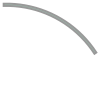

In [287]:
existing_line.buffer(0.05, cap_style=2, join_style=2)

In [289]:
ft.current_line[-20:].buffer(0.05, cap_style=2, join_style=2)

TypeError: 'LineString' object is not subscriptable

In [238]:
t.current_line[:-8]

TypeError: 'NoneType' object is not subscriptable

In [329]:
n_checks_per_iter = 15
n_iters = 200
all_lines = MultiLineString()
all_lines_buffered = Polygon()
n_turtles = 3
n_eval_points = 16
for kk in range(n_turtles):
    start_pt = gp.get_random_point_in_polygon(drawbox)
    t = Turtle(start_pt)
    t.pen_down()
    t.circle(
        np.random.uniform(0.3,20), 
        np.random.uniform(-120, 120), 
        use_degrees=True,
        n_eval_points=20,
    )
    
    for jj in tqdm(range(n_iters)):
        existing_line = t.current_line.buffer(0.05, cap_style=2, join_style=2, resolution=1)
        future_turtles = [copy.deepcopy(t) for i in range(n_checks_per_iter)]
        new_lines = []
        for ft in future_turtles:
            ft.circle(
                np.random.uniform(1, 10.1), 
                np.random.uniform(-120, 120), 
                use_degrees=True,
                n_eval_points=n_eval_points,
            )
            new_line = LineString(ft.pts_in_current_line[-(n_eval_points)+1:]).buffer(0.05, cap_style=2, join_style=2, resolution=1)
            new_lines.append(new_line)
        
        distances = np.array([ft.loc.distance(existing_line) for ft in future_turtles])
        distance_ranks = np.argsort(distances)
        no_cross_current = ~np.array([new_line.intersects(existing_line) for new_line in new_lines])
        not_too_close = distances > 1
        in_drawbox = [ft.loc.within(drawbox) for ft in future_turtles]
        no_cross_others = ~np.array([new_line.intersects(all_lines_buffered) for new_line in new_lines])
        okay = no_cross_current & in_drawbox & not_too_close & no_cross_others
        if okay.sum() < 1:
            break
        winner = distance_ranks[okay][0]
        t = future_turtles[winner]
        
    t.pen_up()
        
    all_lines = gp.merge_LineStrings([all_lines, t.lines])
    all_lines_buffered = all_lines.buffer(0.05, cap_style=2, join_style=2, resolution=1)

100%|██████████| 200/200 [01:42<00:00,  1.96it/s]


In [328]:
sk = vsketch.Vsketch()
sk.size(paper.page_format_mm)
sk.scale('1mm')
sk.penWidth('0.5mm')
sk.geometry(all_lines)

# tolerance=0.5
# sk.vpype(f'linemerge --tolerance {tolerance}mm linesort')
# sk.vpype('linesimplify --tolerance 0.1 linesimplify --tolerance 0.1 linesort')
sk.display()

<?xml version="1.0" encoding="utf-8" ?>
 
 
 
 
 image/svg+xml 
 
 2021-01-14T00:23:18.755707 
 
 
 
 
 
 <polyline points="585.9799,583.9056 590.368,583.9056 594.7436,583.5756 599.0821,582.9174 603.3587,581.9348 607.5493,580.6334 611.6302,579.0205 615.5783,577.1052 619.3711,574.8985 622.9871,572.4127 626.4061,569.662 629.6084,566.662 632.5761,563.4297 635.2922,559.9833 637.7415,556.3423 639.91,552.5275 641.7854,548.5605 643.3572,544.4636 644.6165,540.26 645.556,535.9737 646.1705,531.6289 646.1874,531.3698 646.207,531.111 646.2292,530.8523 646.254,530.5939 646.2815,530.3357 646.3115,530.0778 646.3443,529.8203 646.3796,529.5631 646.4176,529.3062 646.4581,529.0498 646.5013,528.7938 646.5471,528.5382 646.5955,528.2832 646.6465,528.0286 646.7,527.7746 646.7562,527.5211 646.7833,527.4046 646.8071,527.2875 646.8278,527.1697 646.8453,527.0514 646.8595,526.9327 646.8705,526.8137 646.8783,526.6944 646.8828,526.5749 646.884,526.4553 646.882,526.3358 646.8768,526.2164 646.8683,526.0971 646.8565,525.9781 646.8415,525.8595 646.8233,525.7413 646.8019,525.6237 646.7835,525.536 646.7665,525.448 646.7511,525.3597 646.7371,525.2712 646.7246,525.1825 646.7136,525.0935 646.7042,525.0044 646.6962,524.9152 646.6897,524.8258 646.6848,524.7363 646.6814,524.6467 646.6794,524.5572 646.679,524.4675 646.6801,524.3779 646.6828,524.2884 646.6869,524.1988 646.6872,524.1939 646.6875,524.1889 646.6878,524.1839 646.6881,524.1789 646.6885,524.1739 646.6888,524.169 646.6891,524.164 646.6894,524.159 646.6897,524.154 646.69,524.1491 646.6903,524.1441 646.6906,524.1391 646.6909,524.1341 646.6912,524.1291 646.6915,524.1242 646.6918,524.1192 646.7061,523.8751 646.7111,523.6307 646.7068,523.3862 646.693,523.1421 646.67,522.8987 646.6376,522.6563 646.5959,522.4154 646.5451,522.1763 646.4851,521.9392 646.416,521.7047 646.3381,521.4729 646.2513,521.2444 646.1558,521.0193 646.0518,520.798 645.9394,520.5809 645.8187,520.3683 645.7821,520.3092 645.7453,520.2503 645.7084,520.1915 645.6712,520.1328 645.6339,520.0742 645.5964,520.0157 645.5587,519.9574 645.5207,519.8992 645.4826,519.8411 645.4444,519.7832 645.4059,519.7253 645.3672,519.6676 645.3284,519.61 645.2894,519.5526 645.2501,519.4952 645.2107,519.438 644.9997,519.1338 644.7774,518.8377 644.5442,518.5501 644.3005,518.2714 644.0465,518.002 643.7826,517.7423 643.5092,517.4926 643.2266,517.2533 642.9353,517.0247 642.6357,516.8072 642.3281,516.6011 642.0131,516.4065 641.691,516.2239 641.3623,516.0535 641.0274,515.8954 640.6869,515.75 640.6411,515.7324 640.5951,515.715 640.5491,515.6979 640.5029,515.6809 640.4567,515.6643 640.4105,515.6478 640.3641,515.6315 640.3176,515.6155 640.2711,515.5998 640.2245,515.5842 640.1778,515.5689 640.1311,515.5538 640.0843,515.5389 640.0374,515.5243 639.9904,515.5099 639.9434,515.4957 639.7842,515.4485 639.6248,515.4022 639.4651,515.3566 639.3052,515.3118 639.1452,515.2679 638.9849,515.2247 638.8243,515.1823 638.6636,515.1406 638.5027,515.0998 638.3416,515.0598 638.1803,515.0206 638.0188,514.9821 637.8571,514.9445 637.6952,514.9076 637.5331,514.8716 637.3709,514.8364 637.1274,514.7847 636.8859,514.724 636.647,514.6544 636.4107,514.5759 636.1776,514.4887 635.9478,514.3929 635.7218,514.2885 635.4998,514.1758 635.2822,514.055 635.0692,513.9261 634.8612,513.7893 634.6584,513.645 634.4612,513.4931 634.2697,513.334 634.0843,513.168 633.9052,512.9951 633.7511,512.8348 633.5982,512.6736 633.4464,512.5112 633.2957,512.3478 633.1462,512.1834 632.9978,512.0179 632.8505,511.8514 632.7045,511.6838 632.5596,511.5153 632.4159,511.3457 632.2733,511.1752 632.132,511.0036 631.9918,510.8311 631.8529,510.6576 631.7152,510.4832 631.5786,510.3078 631.5159,510.226 631.4519,510.1453 631.3864,510.0657 631.3197,509.9872 631.2517,509.9098 631.1823,509.8336 631.1117,509.7585 631.0399,509.6847 630.9668,509.612 630.8925,509.5406 630.8171,509.4704 630.7405,509.4015 630.6627,509.3339 630.5838,509.2676 630.5038,509.2027 630.4228,509.1391 630.3928,509.1163 630.3629,509.0935 630.333,509.0705 630.3033,509.0475 630.2736,509.0243 

# iteration not repetition

In [462]:
n_iters = 150
std = 0.0008

# c = Point((0,0)).buffer(20, resolution=120).boundary
sq = Point((0,0)).buffer(20, resolution=1).boundary
c =  Polygon([sq.interpolate(x, normalized=True) for x in np.linspace(0, 1, 200)]).boundary
rings = [c]
for i in range(n_iters):
    current_ring = np.array([x for x in c.coords])
    current_ring *= np.random.normal(loc=1, scale=std, size=current_ring.shape)
    current_ring += np.ones_like(current_ring) * np.array([0.5, -0.1])
    c = LineString(current_ring)
    c = sa.rotate(c, -0.5)
    c = sa.scale(c, xfact=1.006, yfact=1.005)
    rings.append(c)

In [463]:
mls = MultiLineString([r for r in rings])
layer = gp.make_like(mls, drawbox)

In [464]:
# make page
paper_size = '14x11 inches'
border:float=35
paper = Paper(paper_size)

drawbox = paper.get_drawbox(border)

In [465]:
sk = vsketch.Vsketch()
sk.size(paper.page_format_mm)
sk.scale('1mm')
sk.penWidth('0.5mm')
sk.geometry(layer)
sk.vpype('linesort')
sk.display()

<?xml version="1.0" encoding="utf-8" ?>
 
 
 
 
 image/svg+xml 
 
 2021-01-14T02:06:48.761553 
 
 
 
 
 
 <polygon points="438.7285,641.7646 435.6331,638.6692 432.5377,635.5738 429.4423,632.4784 426.3469,629.3829 423.2515,626.2875 420.1561,623.1921 417.0607,620.0967 413.9653,617.0013 410.8699,613.9059 407.7745,610.8105 404.6791,607.7151 401.5837,604.6197 398.4883,601.5243 395.3929,598.4289 392.2975,595.3335 389.2021,592.2381 386.1067,589.1427 383.0113,586.0473 379.9159,582.9519 376.8204,579.8565 373.725,576.7611 370.6296,573.6657 367.5342,570.5703 364.4388,567.4749 361.3434,564.3794 358.248,561.284 355.1526,558.1886 352.0572,555.0932 348.9618,551.9978 345.8664,548.9024 342.771,545.807 339.6756,542.7116 336.5802,539.6162 333.4848,536.5208 330.3894,533.4254 327.294,530.33 324.1986,527.2346 321.1032,524.1392 318.0078,521.0438 314.9124,517.9484 311.8169,514.853 308.7215,511.7576 305.6261,508.6622 302.5307,505.5668 299.4353,502.4713 296.3399,499.3759 293.2445,496.2805 290.1491,493.1851 287.0537,490.0897 283.9583,488.542 280.8629,491.6374 277.7675,494.7328 274.6721,497.8282 271.5767,500.9236 268.4813,504.0191 265.3859,507.1145 262.2905,510.2099 259.1951,513.3053 256.0997,516.4007 253.0043,519.4961 249.9088,522.5915 246.8134,525.6869 243.718,528.7823 240.6226,531.8777 237.5272,534.9731 234.4318,538.0685 231.3364,541.1639 228.241,544.2593 225.1456,547.3547 222.0502,550.4501 218.9548,553.5455 215.8594,556.6409 212.764,559.7363 209.6686,562.8317 206.5732,565.9271 203.4778,569.0226 200.3824,572.118 197.287,575.2134 194.1916,578.3088 191.0962,581.4042 188.0008,584.4996 184.9053,587.595 181.8099,590.6904 178.7145,593.7858 175.6191,596.8812 172.5237,599.9766 169.4283,603.072 166.3329,606.1674 163.2375,609.2628 160.1421,612.3582 157.0467,615.4536 153.9513,618.549 150.8559,621.6444 147.7605,624.7398 144.6651,627.8352 141.5697,630.9307 138.4743,634.0261 135.3789,637.1215 132.2835,640.2169 132.2835,643.3123 135.3789,646.4077 138.4743,649.5031 141.5697,652.5985 144.6651,655.6939 147.7605,658.7893 150.8559,661.8847 153.9513,664.9801 157.0467,668.0755 160.1421,671.1709 163.2375,674.2663 166.3329,677.3617 169.4283,680.4571 172.5237,683.5525 175.6191,686.6479 178.7145,689.7433 181.8099,692.8387 184.9053,695.9342 188.0008,699.0296 191.0962,702.125 194.1916,705.2204 197.287,708.3158 200.3824,711.4112 203.4778,714.5066 206.5732,717.602 209.6686,720.6974 212.764,723.7928 215.8594,726.8882 218.9548,729.9836 222.0502,733.079 225.1456,736.1744 228.241,739.2698 231.3364,742.3652 234.4318,745.4606 237.5272,748.556 240.6226,751.6514 243.718,754.7468 246.8134,757.8423 249.9088,760.9377 253.0043,764.0331 256.0997,767.1285 259.1951,770.2239 262.2905,773.3193 265.3859,776.4147 268.4813,779.5101 271.5767,782.6055 274.6721,785.7009 277.7675,788.7963 280.8629,791.8917 283.9583,794.9871 287.0537,793.4394 290.1491,790.344 293.2445,787.2486 296.3399,784.1532 299.4353,781.0578 302.5307,777.9624 305.6261,774.867 308.7215,771.7716 311.8169,768.6762 314.9124,765.5808 318.0078,762.4854 321.1032,759.39 324.1986,756.2945 327.294,753.1991 330.3894,750.1037 333.4848,747.0083 336.5802,743.9129 339.6756,740.8175 342.771,737.7221 345.8664,734.6267 348.9618,731.5313 352.0572,728.4359 355.1526,725.3405 358.248,722.2451 361.3434,719.1497 364.4388,716.0543 367.5342,712.9589 370.6296,709.8635 373.725,706.7681 376.8204,703.6727 379.9159,700.5773 383.0113,697.4819 386.1067,694.3865 389.2021,691.291 392.2975,688.1956 395.3929,685.1002 398.4883,682.0048 401.5837,678.9094 404.6791,675.814 407.7745,672.7186 410.8699,669.6232 413.9653,666.5278 417.0607,663.4324 420.1561,660.337 423.2515,657.2416 426.3469,654.1462 429.4423,651.0508 432.5377,647.9554 435.6331,644.86"/>
 <polyline points="443.6335,639.65 440.3298,642.7873 437.4108,645.926 434.0346,649.0709 431.0838,652.1978 428.131,655.3426 425.0372,658.4599 421.8435,661.6106 418.7629,664.7477 415.747,667.8761 412.7229,671.0273 409.4983,674.1993 406.4858,677.2674 403.1948,680.4848 400.3992,683.6004 397.246,686.7233 394.001,689.826 390.9944,692.9

In [466]:
sk.save('/mnt/c/code/side/plotter_images/oned_outputs/191_do_not_repeat.svg')

## try 2

In [53]:
# make page
paper_size = '17x11 inches'
border:float=35
paper = Paper(paper_size)

drawbox = paper.get_drawbox(border)

In [78]:
n_iters = 250
low = 0.9999
high = 1.0001

# c = Point((0,0)).buffer(20, resolution=120).boundary
sq = Point((0,0)).buffer(20, resolution=1).boundary
c =  Polygon([sq.interpolate(x, normalized=True) for x in np.linspace(0, 1, 200)]).boundary
rings = [c]
rands = np.random.uniform(low, high, size=current_ring.shape)
for i in range(n_iters):
    current_ring = np.array([x for x in c.coords])
    current_ring *= rands
    current_ring += np.ones_like(current_ring) * np.array([0.5, -0.2])
    c = LineString(current_ring)
    c = sa.rotate(c, 0.6)
    c = sa.scale(c, xfact=1.006, yfact=1.008)
    rings.append(c)

In [79]:
mls = MultiLineString([r for r in rings])
layer = gp.make_like(mls, drawbox)

In [80]:
sk = vsketch.Vsketch()
sk.size(paper.page_format_mm)
sk.scale('1mm')
sk.penWidth('0.5mm')
sk.geometry(layer)
sk.vpype('linesort')
sk.display()

<?xml version="1.0" encoding="utf-8" ?>
 
 
 
 
 image/svg+xml 
 
 2021-01-14T12:07:01.952985 
 
 
 
 
 
 <polygon points="454.4686,739.7575 452.7535,738.0423 451.0383,736.3272 449.3231,734.612 447.6079,732.8968 445.8928,731.1817 444.1776,729.4665 442.4624,727.7513 440.7473,726.0361 439.0321,724.321 437.3169,722.6058 435.6017,720.8906 433.8866,719.1755 432.1714,717.4603 430.4562,715.7451 428.7411,714.0299 427.0259,712.3148 425.3107,710.5996 423.5955,708.8844 421.8804,707.1693 420.1652,705.4541 418.45,703.7389 416.7349,702.0237 415.0197,700.3086 413.3045,698.5934 411.5893,696.8782 409.8742,695.1631 408.159,693.4479 406.4438,691.7327 404.7287,690.0175 403.0135,688.3024 401.2983,686.5872 399.5831,684.872 397.868,683.1569 396.1528,681.4417 394.4376,679.7265 392.7225,678.0113 391.0073,676.2962 389.2921,674.581 387.5769,672.8658 385.8618,671.1507 384.1466,669.4355 382.4314,667.7203 380.7163,666.0051 379.0011,664.29 377.2859,662.5748 375.5707,660.8596 373.8556,659.1445 372.1404,657.4293 370.4252,655.7141 368.7101,654.8565 366.9949,656.5717 365.2797,658.2869 363.5645,660.002 361.8494,661.7172 360.1342,663.4324 358.419,665.1476 356.7039,666.8627 354.9887,668.5779 353.2735,670.2931 351.5583,672.0082 349.8432,673.7234 348.128,675.4386 346.4128,677.1538 344.6977,678.8689 342.9825,680.5841 341.2673,682.2993 339.5521,684.0144 337.837,685.7296 336.1218,687.4448 334.4066,689.16 332.6914,690.8751 330.9763,692.5903 329.2611,694.3055 327.5459,696.0206 325.8308,697.7358 324.1156,699.451 322.4004,701.1662 320.6852,702.8813 318.9701,704.5965 317.2549,706.3117 315.5397,708.0268 313.8246,709.742 312.1094,711.4572 310.3942,713.1724 308.679,714.8875 306.9639,716.6027 305.2487,718.3179 303.5335,720.033 301.8184,721.7482 300.1032,723.4634 298.388,725.1786 296.6728,726.8937 294.9577,728.6089 293.2425,730.3241 291.5273,732.0392 289.8122,733.7544 288.097,735.4696 286.3818,737.1848 284.6666,738.8999 284.6666,740.6151 286.3818,742.3303 288.097,744.0454 289.8122,745.7606 291.5273,747.4758 293.2425,749.191 294.9577,750.9061 296.6728,752.6213 298.388,754.3365 300.1032,756.0516 301.8184,757.7668 303.5335,759.482 305.2487,761.1972 306.9639,762.9123 308.679,764.6275 310.3942,766.3427 312.1094,768.0578 313.8246,769.773 315.5397,771.4882 317.2549,773.2034 318.9701,774.9185 320.6852,776.6337 322.4004,778.3489 324.1156,780.064 325.8308,781.7792 327.5459,783.4944 329.2611,785.2096 330.9763,786.9247 332.6914,788.6399 334.4066,790.3551 336.1218,792.0702 337.837,793.7854 339.5521,795.5006 341.2673,797.2158 342.9825,798.9309 344.6977,800.6461 346.4128,802.3613 348.128,804.0765 349.8432,805.7916 351.5583,807.5068 353.2735,809.222 354.9887,810.9371 356.7039,812.6523 358.419,814.3675 360.1342,816.0827 361.8494,817.7978 363.5645,819.513 365.2797,821.2282 366.9949,822.9433 368.7101,824.6585 370.4252,823.8009 372.1404,822.0858 373.8556,820.3706 375.5707,818.6554 377.2859,816.9402 379.0011,815.2251 380.7163,813.5099 382.4314,811.7947 384.1466,810.0796 385.8618,808.3644 387.5769,806.6492 389.2921,804.934 391.0073,803.2189 392.7225,801.5037 394.4376,799.7885 396.1528,798.0733 397.868,796.3582 399.5831,794.643 401.2983,792.9278 403.0135,791.2127 404.7287,789.4975 406.4438,787.7823 408.159,786.0671 409.8742,784.352 411.5893,782.6368 413.3045,780.9216 415.0197,779.2065 416.7349,777.4913 418.45,775.7761 420.1652,774.0609 421.8804,772.3458 423.5955,770.6306 425.3107,768.9154 427.0259,767.2003 428.7411,765.4851 430.4562,763.7699 432.1714,762.0547 433.8866,760.3396 435.6017,758.6244 437.3169,756.9092 439.0321,755.1941 440.7473,753.4789 442.4624,751.7637 444.1776,750.0485 445.8928,748.3334 447.6079,746.6182 449.3231,744.903 451.0383,743.1879 452.7535,741.4727"/>
 <polyline points="457.102,739.8004 455.3653,741.5111 453.6137,743.2219 451.8769,744.9322 450.125,746.6431 448.3926,748.3543 446.6478,750.0636 444.904,751.7765 443.1599,753.4852 441.4115,755.1971 439.6662,756.9075 437.9313,758.6178 436.1829,760.3296 434.4481,762.0381 432.6998,763.7485 430.9545,765.4627 429.2127,767.1725 427.4738,768

In [81]:
sk.save('/mnt/c/code/side/plotter_images/oned_outputs/192_do_not_repeat.svg')

## try 3

In [83]:
# make page
paper_size = '17x11 inches'
border:float=35
paper = Paper(paper_size)

drawbox = paper.get_drawbox(border)

In [119]:
sq = Point((0,0)).buffer(20, resolution=1).boundary
c =  Polygon([sq.interpolate(x, normalized=True) for x in np.linspace(0, 1, 200)]).boundary

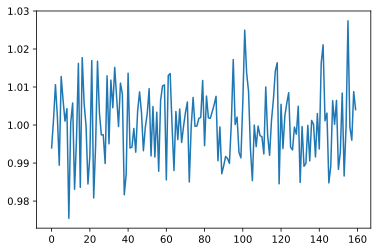

In [218]:
mu=0
sigma=0.01
rands = np.random.lognormal(mean=mu, sigma=sigma, size=current_ring.shape)
plt.plot(rands.ravel())

array([1.00005398, 1.00015384])

In [328]:
n_iters = 280
low = 0.9999
high = 1.0002
mu=0
sigma=0.00015

# c = Point((0,0)).buffer(20, resolution=120).boundary
sq = Point((0,0)).buffer(20, resolution=5).boundary
c =  Polygon([sq.interpolate(x, normalized=True) for x in np.linspace(0, 1, 80)]).boundary
rings = [c]
current_ring = np.array([x for x in c.coords])
rands = np.random.uniform(low, high, size=current_ring.shape)
# rands = np.random.lognormal(mean=mu, sigma=sigma, size=current_ring.shape)
for i in range(n_iters):
    current_ring = np.array([x for x in c.coords])
    current_ring *= rands
    current_ring += np.ones_like(current_ring) * np.array([1.7, -0.6])
    c = LineString(current_ring)
#     c = sa.skew(c, xs=0.1)
    c = sa.rotate(c, 0.7)
    c = sa.scale(c, xfact=1.004, yfact=1.014)
    
    rings.append(c)

In [329]:
mls = MultiLineString([r for r in rings])
layer = gp.make_like(mls, drawbox)

In [330]:
sk = vsketch.Vsketch()
sk.size(paper.page_format_mm)
sk.scale('1mm')
sk.penWidth('0.5mm')
sk.geometry(layer)
# sk.vpype('linesort')
sk.display()

<?xml version="1.0" encoding="utf-8" ?>
 
 
 
 
 image/svg+xml 
 
 2021-01-14T13:53:40.301325 
 
 
 
 
 
 <polygon points="297.9933,781.1393 297.6151,778.7512 297.2369,776.363 296.8586,773.9749 296.4444,771.5985 295.3467,769.4441 294.249,767.2898 293.1513,765.1354 291.9924,763.0255 290.2827,761.3158 288.573,759.6061 286.8633,757.8964 285.0869,756.2785 282.9325,755.1808 280.7782,754.0831 278.6238,752.9854 276.4227,752.0316 274.0346,751.6534 271.6465,751.2751 269.2584,750.8969 266.8702,750.7078 264.4821,751.086 262.094,751.4643 259.7059,751.8425 257.3879,752.4366 255.2335,753.5343 253.0792,754.632 250.9248,755.7297 248.9261,757.0416 247.2164,758.7513 245.5067,760.461 243.797,762.1707 242.3321,764.0582 241.2344,766.2126 240.1367,768.367 239.039,770.5213 238.2651,772.7809 237.8868,775.169 237.5086,777.5571 237.1303,779.9452 237.1303,782.3333 237.5086,784.7215 237.8868,787.1096 238.2651,789.4977 239.039,791.7572 240.1367,793.9116 241.2344,796.066 242.3321,798.2203 243.797,800.1079 245.5067,801.8176 247.2164,803.5273 248.9261,805.237 250.9248,806.5489 253.0792,807.6466 255.2335,808.7443 257.3879,809.842 259.7059,810.4361 262.094,810.8143 264.4821,811.1925 266.8702,811.5708 269.2584,811.3817 271.6465,811.0034 274.0346,810.6252 276.4227,810.2469 278.6238,809.2931 280.7782,808.1954 282.9325,807.0977 285.0869,806.0 286.8633,804.3821 288.573,802.6724 290.2827,800.9627 291.9924,799.253 293.1513,797.1431 294.249,794.9888 295.3467,792.8344 296.4444,790.6801 296.8586,788.3036 297.2369,785.9155 297.6151,783.5274"/>
 <polyline points="300.7136,780.6007 300.3613,778.1744 300.0113,775.749 299.6534,773.322 299.2734,770.9073 298.1959,768.7091 297.1169,766.5106 296.0414,764.3145 294.9031,762.1578 293.2084,760.4025 291.5124,758.6474 289.8227,756.8978 288.0577,755.236 285.9076,754.092 283.7556,752.9528 281.6063,751.8127 279.4106,750.8194 277.017,750.4061 274.6237,749.9928 272.2309,749.581 269.8354,749.3592 267.433,749.7105 265.0307,750.0625 262.6282,750.4194 260.2929,750.993 258.1171,752.0829 255.9414,753.1662 253.7646,754.2511 251.7399,755.5559 250.0038,757.2739 248.2674,758.9838 246.529,760.6955 245.039,762.5912 243.9067,764.7609 242.7766,766.9343 241.6477,769.104 240.8483,771.3846 240.4346,773.8022 240.0305,776.2194 239.618,778.6358 239.5871,781.0575 239.9371,783.4839 240.2894,785.9098 240.6413,788.335 241.3883,790.6359 242.462,792.8356 243.5401,795.0344 244.6203,797.2298 246.0626,799.1653 247.7608,800.9183 249.4576,802.6699 251.1502,804.4244 253.1395,805.7859 255.2925,806.9216 257.4423,808.0614 259.5896,809.2005 261.9095,809.8311 264.3035,810.2427 266.6958,810.6621 269.089,811.0682 271.4889,810.909 273.8915,810.5517 276.2936,810.2058 278.6943,809.8457 280.917,808.9113 283.092,807.8249 285.2685,806.7384 287.4475,805.6467 289.2477,804.0304 290.9862,802.3167 292.7278,800.6031 294.4634,798.8934 295.6491,796.7679 296.7812,794.5961 297.9094,792.4277 299.0377,790.2555 299.4812,787.8503 299.8885,785.4348 300.2986,783.0176 300.7072,780.6006"/>
 <polyline points="303.4302,780.0691 303.1043,777.6043 302.7831,775.1416 302.4454,772.6753 302.1009,770.2223 301.0439,767.9799 299.9839,765.7369 298.9312,763.4987 297.814,761.2947 296.1351,759.4934 294.4532,757.6925 292.7849,755.9027 291.0319,754.1966 288.8866,753.0056 286.7367,751.8244 284.593,750.6412 282.4039,749.6081 280.0052,749.1592 277.607,748.7102 275.2099,748.2644 272.8078,748.0093 270.3913,748.3331 267.9749,748.6582 265.5582,748.9934 263.206,749.546 261.0087,750.6279 258.8114,751.6963 256.6123,752.7678 254.5619,754.065 252.7991,755.7914 251.0358,757.501 249.2685,759.2144 247.7528,761.1181 246.5861,763.3027 245.4234,765.4953 244.2629,767.6801 243.4372,769.9814 242.9879,772.4286 242.5571,774.8752 242.1101,777.3195 242.048,779.7749 242.3691,782.2398 242.6948,784.7038 243.0197,787.1664 243.7393,789.5088 244.7885,791.7541 245.8463,793.9976 246.9079,796.2347 248.3274,798.2184 250.0133,800.0152 251.6965,801.8093 253.3717,803.6088 255.3511,805.0203 257.5017,806.1947 259.6464,807.3772 261.7865,808.5581 264.1079,809

In [318]:
sk.save('/mnt/c/code/side/plotter_images/oned_outputs/194_do_not_repeat.svg')

In [367]:
n_iters = 480
low = 0.9999
high = 1.0002
mu=0
sigma=0.00015

# c = Point((0,0)).buffer(20, resolution=120).boundary
sq = Point((0,0)).buffer(20, resolution=1).boundary
c =  Polygon([sq.interpolate(x, normalized=True) for x in np.linspace(0, 1, 80)]).boundary
rings = [c]
current_ring = np.array([x for x in c.coords])
rands = np.random.uniform(low, high, size=current_ring.shape)
# rands = np.random.lognormal(mean=mu, sigma=sigma, size=current_ring.shape)
for i in range(n_iters):
    current_ring = np.array([x for x in c.coords])
    current_ring *= rands
    current_ring += np.ones_like(current_ring) * np.array([0.3, -0.03])
    c = LineString(current_ring)
#     c = sa.skew(c, xs=0.1)
    c = sa.rotate(c, 0.6)
    c = sa.scale(c, xfact=1.0035, yfact=1.0)
    
    rings.append(c)

In [368]:
mls = MultiLineString([r for r in rings])
layer = gp.make_like(mls, drawbox)

In [369]:
sk = vsketch.Vsketch()
sk.size(paper.page_format_mm)
sk.scale('1mm')
sk.penWidth('0.5mm')
sk.geometry(layer)
# sk.vpype('linesort')
sk.display()

<?xml version="1.0" encoding="utf-8" ?>
 
 
 
 
 image/svg+xml 
 
 2021-01-14T16:32:44.081749 
 
 
 
 
 
 <polygon points="387.9744,612.6327 381.4183,606.0765 374.8621,599.5203 368.3059,592.9642 361.7497,586.408 355.1935,579.8518 348.6374,573.2956 342.0812,566.7394 335.525,560.1833 328.9688,553.6271 322.4126,547.0709 315.8565,540.5147 309.3003,533.9586 302.7441,527.4024 296.1879,520.8462 289.6318,514.29 283.0756,507.7338 276.5194,501.1777 269.9632,494.6215 263.407,488.0653 256.8509,484.7872 250.2947,491.3434 243.7385,497.8996 237.1823,504.4557 230.6261,511.0119 224.07,517.5681 217.5138,524.1243 210.9576,530.6805 204.4014,537.2366 197.8453,543.7928 191.2891,550.349 184.7329,556.9052 178.1767,563.4614 171.6205,570.0175 165.0644,576.5737 158.5082,583.1299 151.952,589.6861 145.3958,596.2422 138.8396,602.7984 132.2835,609.3546 132.2835,615.9108 138.8396,622.467 145.3958,629.0231 151.952,635.5793 158.5082,642.1355 165.0644,648.6917 171.6205,655.2479 178.1767,661.804 184.7329,668.3602 191.2891,674.9164 197.8453,681.4726 204.4014,688.0287 210.9576,694.5849 217.5138,701.1411 224.07,707.6973 230.6261,714.2535 237.1823,720.8096 243.7385,727.3658 250.2947,733.922 256.8509,740.4782 263.407,737.2001 269.9632,730.6439 276.5194,724.0877 283.0756,717.5316 289.6318,710.9754 296.1879,704.4192 302.7441,697.863 309.3003,691.3068 315.8565,684.7507 322.4126,678.1945 328.9688,671.6383 335.525,665.0821 342.0812,658.5259 348.6374,651.9698 355.1935,645.4136 361.7497,638.8574 368.3059,632.3012 374.8621,625.7451 381.4183,619.1889"/>
 <polyline points="390.3808,613.7775 383.8545,607.152 377.3478,600.5288 370.8328,593.903 364.3164,587.2779 357.8195,580.6558 351.2893,574.0306 344.7859,567.4005 338.2768,560.777 331.7652,554.1587 325.263,547.5212 318.7439,540.9077 312.2349,534.2854 305.7376,527.6438 299.2247,521.0263 292.7102,514.4002 286.2011,507.7868 279.6903,501.1583 273.1804,494.5161 266.6691,487.9245 260.1253,484.5715 253.4767,491.042 246.8276,497.5367 240.1795,504.0311 233.535,510.5209 226.8865,517.0091 220.2331,523.4808 213.5949,529.9597 206.9488,536.461 200.294,542.9552 193.6489,549.4333 187.0078,555.9151 180.346,562.4067 173.7025,568.8914 167.0432,575.3879 160.417,581.8741 153.7639,588.3622 147.0953,594.8454 140.4439,601.3343 133.8167,607.8214 133.7289,614.3774 140.2379,621.0032 146.7629,627.6261 153.2763,634.2499 159.7896,640.875 166.3002,647.5042 172.7934,654.1275 179.3091,660.7542 185.8294,667.3683 192.3348,674.0055 198.8419,680.6278 205.3591,687.2409 211.867,693.8689 218.3721,700.5129 224.8909,707.1321 231.3954,713.7597 237.9104,720.3628 244.42,727.0065 250.9284,733.631 257.4386,740.2333 264.052,737.0233 270.6988,730.5689 277.348,724.0626 283.999,717.5722 290.6468,711.0907 297.2878,704.591 303.9437,698.1041 310.585,691.6167 317.2411,685.1321 323.8765,678.6558 330.5372,672.1706 337.1744,665.6777 343.8401,659.1842 350.4782,652.6997 357.1172,646.2138 363.7855,639.7248 370.4039,633.2371 377.0808,626.7529 383.7097,620.2651 390.3743,613.7774"/>
 <polyline points="392.7749,614.9273 386.279,608.2328 379.8227,601.5431 373.3496,594.8482 366.8738,588.1545 360.4373,581.4671 353.9333,574.7731 347.4839,568.0698 341.0227,561.3795 334.5565,554.6993 328.1097,547.9811 321.6279,541.3107 315.1669,534.6227 308.7304,527.8964 302.2615,521.218 295.789,514.5224 289.328,507.8522 282.8634,501.152 276.4009,494.4243 269.9347,487.7977 263.4042,484.37 256.6642,490.7538 249.9225,497.1859 243.1828,503.6177 236.45,510.0402 229.7096,516.4594 222.96,522.8456 216.2396,529.2463 209.5039,535.6918 202.7511,542.1232 196.0175,548.5222 189.2917,554.9285 182.5249,561.3545 175.7944,567.7668 169.0327,574.2028 162.3363,580.6181 155.5868,587.0373 148.8066,593.4461 142.0604,599.8669 135.3624,606.284 135.1866,612.839 141.6477,619.5338 148.1404,626.2234 154.6102,632.9142 161.0797,639.6078 167.5437,646.3094 173.9732,652.9993 180.4475,659.6959 186.931,666.3678 193.3847,673.0852 199.842,679.7733 206.3193,686.443 212.778,693.1422 219.231,699.8733 225.7115,706.5554 232.1636,713.2537 238.6365,719.9035 2

In [370]:
sk.save('/mnt/c/code/side/plotter_images/oned_outputs/195_do_not_repeat.svg')

In [2]:
# make page
paper_size = '14x11 inches'
border:float=35
paper = Paper(paper_size)

drawbox = paper.get_drawbox(border)

In [6]:
?gp.RegPolygon

Init signature:
gp.RegPolygon(
    point: shapely.geometry.point.Point,
    radius: float = 1.0,
    n_corners: int = 6,
    rotation: float = 0.0,
) -> None
Docstring:      RegPolygon(point: shapely.geometry.point.Point, radius: float = 1.0, n_corners: int = 6, rotation: float = 0.0)
File:           /mnt/c/code/side/genpen/src/genpen/genpen.py
Type:           type
Subclasses:     


In [47]:
n_iters = 280
low = 0.9999
high = 1.0007
mu=0
sigma=0.00015

# c = Point((0,0)).buffer(20, resolution=120).boundary
sq = Point((0,0)).buffer(20, resolution=1).boundary
sq = gp.RegPolygon(Point(0,0), n_corners=6).poly.boundary
c =  Polygon([sq.interpolate(x, normalized=True) for x in np.linspace(0, 1, 80)]).boundary
rings = [c]
current_ring = np.array([x for x in c.coords])
rands = np.random.uniform(low, high, size=current_ring.shape)
# rands = np.random.lognormal(mean=mu, sigma=sigma, size=current_ring.shape)
for i in range(n_iters):
    current_ring = np.array([x for x in c.coords])
    current_ring *= rands
    current_ring += np.ones_like(current_ring) * np.array([0.05, -0.02])
    c = LineString(current_ring)
#     c = sa.skew(c, xs=0.1)
    c = sa.rotate(c, 0.6)
    c = sa.scale(c, xfact=1.0035, yfact=1.011)
    
    rings.append(c)

In [48]:
mls = MultiLineString([r for r in rings])
layer = gp.make_like(mls, drawbox)

In [52]:
l = layer[0]

In [56]:
all_pts = [MultiPoint(l.coords) for l in layer]

In [62]:
ps = []
for p in all_pts:
    ps += list(p)

In [75]:
tris = so.triangulate(MultiPoint(ps))

In [76]:
tries = gp.merge_Polygons(tris).boundary

In [77]:
tries = gp.merge_LineStrings([t for t in tries if t.length < 10])

In [78]:
tries

In [80]:
sk = vsketch.Vsketch()
sk.size(paper.page_format_mm)
sk.scale('1mm')
sk.penWidth('0.5mm')
sk.geometry(tries)
sk.vpype('splitall linemerge -t 0.3 linemerge -t 0.6 linemerge -t 0.9 linesort')
sk.display()

<?xml version="1.0" encoding="utf-8" ?>
 
 
 
 
 image/svg+xml 
 
 2021-01-22T23:19:10.440643 
 
 
 
 
 
 <polygon points="134.8095,753.7454 136.8316,752.4216 136.8316,752.4216 140.4837,754.0802 140.4837,754.0802 136.8316,752.4216 136.8316,752.4216 138.8583,751.0909 138.8583,751.0909 136.8316,752.4216 136.8316,752.4216 136.8739,749.5025 136.8739,749.5025 134.8095,750.8586 134.8095,750.8586 136.8316,752.4216 136.8316,752.4216 134.8095,753.7454 134.8095,753.7454 138.4798,755.3597 138.4798,755.3597 140.4837,754.0802 140.4837,754.0802 144.0794,755.8309 144.0794,755.8309 140.4837,754.0802 140.4837,754.0802 142.4914,752.7937 142.4914,752.7937 144.5031,751.5002 144.5031,751.5002 146.5187,750.1995 146.5187,750.1995 148.5385,748.8918 148.5385,748.8918 147.0116,745.6996 147.0116,745.6996 145.1766,744.0065 145.1766,744.0065 147.264,742.6144 147.264,742.6144 149.3562,741.215 149.3562,741.215 151.4534,739.8082 151.4534,739.8082 148.9919,739.6393 148.9919,739.6393 151.0998,738.2256 151.0998,738.2256 153.5556,738.3941 153.5556,738.3941 155.2435,740.197 155.2435,740.197 158.7021,742.2443 158.7021,742.2443 160.7483,740.8928 160.7483,740.8928 157.3144,738.8038 157.3144,738.8038 159.3907,737.4034 159.3907,737.4034 160.7483,740.8928 160.7483,740.8928 162.0616,744.4063 162.0616,744.4063 163.4274,747.9134 163.4274,747.9134 161.4437,749.1559 161.4437,749.1559 160.048,745.703 160.048,745.703 163.4274,747.9134 163.4274,747.9134 164.621,751.3862 164.621,751.3862 161.4437,749.1559 161.4437,749.1559 162.6758,752.5775 162.6758,752.5775 160.734,753.7628 160.734,753.7628 157.4858,751.6215 157.4858,751.6215 155.5116,752.8447 155.5116,752.8447 158.7956,754.9421 158.7956,754.9421 156.8605,756.1155 156.8605,756.1155 155.5116,752.8447 155.5116,752.8447 152.0337,750.821 152.0337,750.821 155.5116,752.8447 155.5116,752.8447 156.8605,756.1155 156.8605,756.1155 158.4275,759.4804 158.4275,759.4804 154.9286,757.2829 154.9286,757.2829 156.5141,760.589 156.5141,760.589 152.9999,758.4445 152.9999,758.4445 156.5141,760.589 156.5141,760.589 159.9278,762.7019 159.9278,762.7019 161.8177,761.6333 161.8177,761.6333 163.7085,760.5594 163.7085,760.5594 164.9945,763.9984 164.9945,763.9984 168.1779,766.4188 168.1779,766.4188 164.9945,763.9984 164.9945,763.9984 161.8177,761.6333 161.8177,761.6333 159.9278,762.7019 159.9278,762.7019 163.1415,765.0175 163.1415,765.0175 166.3565,767.3912 166.3565,767.3912 164.9945,763.9984 164.9945,763.9984 166.3565,767.3912 166.3565,767.3912 164.5358,768.3585 164.5358,768.3585 166.3565,767.3912 166.3565,767.3912 169.5779,769.7967 169.5779,769.7967 170.9166,773.4568 170.9166,773.4568 174.0378,776.0281 174.0378,776.0281 170.9166,773.4568 170.9166,773.4568 169.1569,774.3125 169.1569,774.3125 170.9166,773.4568 170.9166,773.4568 167.7848,770.722 167.7848,770.722 165.9916,771.6425 165.9916,771.6425 167.3964,775.1634 167.3964,775.1634 169.1569,774.3125 169.1569,774.3125 172.3083,776.8408 172.3083,776.8408 170.5773,777.6491 170.5773,777.6491 172.3083,776.8408 172.3083,776.8408 169.1569,774.3125 169.1569,774.3125 167.7848,770.722 167.7848,770.722 164.5358,768.3585 164.5358,768.3585 165.9916,771.6425 165.9916,771.6425 167.7848,770.722 167.7848,770.722 166.3565,767.3912 166.3565,767.3912 163.1415,765.0175 163.1415,765.0175 164.5358,768.3585 164.5358,768.3585 167.7848,770.722 167.7848,770.722 170.9166,773.4568 170.9166,773.4568 169.5779,769.7967 169.5779,769.7967 167.7848,770.722 167.7848,770.722 169.1569,774.3125 169.1569,774.3125 165.9916,771.6425 165.9916,771.6425 169.1569,774.3125 169.1569,774.3125 167.3964,775.1634 167.3964,775.1634 165.6352,776.0095 165.6352,776.0095 167.111,779.2525 167.111,779.2525 165.6352,776.0095 165.6352,776.0095 167.3964,775.1634 167.3964,775.1634 164.1982,772.5585 164.1982,772.5585 162.7157,769.3206 162.7157,769.3206 164.5358,768.3585 164.5358,768.3585 161.2895,766.0312 161.2895,766.0312 162.7157,769.3206 162.7157,769.3206 161.2895,766.0312 161.2895,766.0312 164.5358,768.3585 164.5358,768.3585 162.7157,769.3206 162.7157,769.3206 164